# Basic Example

This notebook walks you through some of the high level aspects of the Planetoid API

In [1]:
import sys
sys.path.append("..")

In [2]:
import pandas as pd
import numpy as np
from matplotlib import colors
from sklearn.datasets import make_blobs
from planetoids import planetoids as pt #need to change this
np.random.seed(42)

C:\ProgramData\Anaconda3\lib\site-packages\tqdm\autonotebook\__init__.py:18: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



Using scikit-learn, we will generate some random data that we will use to seed a Planetoid

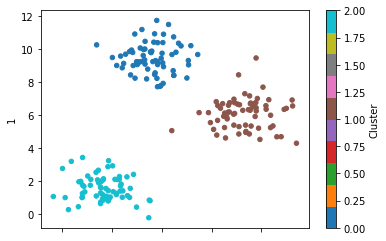

In [3]:
X, y = make_blobs(n_samples=200,
                  n_features=2,
                  centers=3,
                  cluster_std=0.9,
                  center_box=(0,10),
                  random_state=42)
data = pd.DataFrame(X)
data['Cluster'] = y

#plot
data.plot(kind='scatter', x=0, y=1, c='Cluster', cmap='tab10')

## Seed the planet

In [4]:
blob_planet = pt.Planetoid(data, x=0, y=1, cluster_field='Cluster')

## Fit & Terraform in a single step

This will generate all of the data needed to terraform and render our `blob_planet` but calling `fit` and then `terraform`.


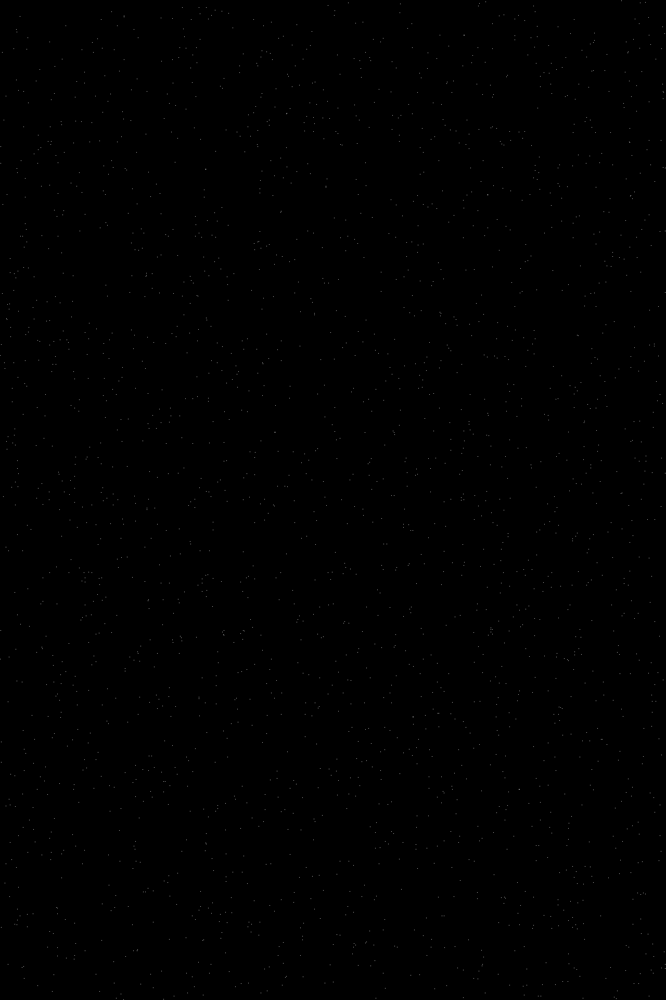

In [5]:
blob_planet.fit_terraform(planet_name='fit_terraform demo')

# Several high level controls are available to you to change how your world will be terraformed

## Ecology

Ecology is one of the simplest changes you can make that produces dramatic difference in the look and feel of a Planetoid. Ecology is considered a key seed element for your planet, as such, you will have to explicitly set it using its own method if you want to change it.

## Topography Levels

This controls the level of detail in the generated land mass contours. Lower values will produce fewer contours and consequently shallower land masses, higher values will help land masses rise out of the 'ocean'. This can result in fundamental shifts in the generated ecology.

## Lighting Levels

This controls the level of detail in the lighting effect. This is meant to add an additional level of depth to your Planetoid. Terraforming allows you to selectively choose whether or not to show the hillshade and highlight independantly of one another.

## Relief Density

This controls the level of detail in the relief. These lines represent the gradient of the generated land mass physical features.

## Projection

This is the map projection that is used to render the planetoid. The default 'orthographic' will produce a 3D sphere effect. Use an 'equirectangular' projection to show the data in a more traditional euclidean space. Interesting distortion effects using some of the more exotic projections are also possible.

We're going to generate 3 planetoids using a different mix of these elements to illustrate some of the variation possible with the same seed data.

Ecology: gist_earth
Topography Levels: 5
Lighting Levels: 20
Relief Density: 2
Projection: orthographic
Highlight: True
Hillshade: False



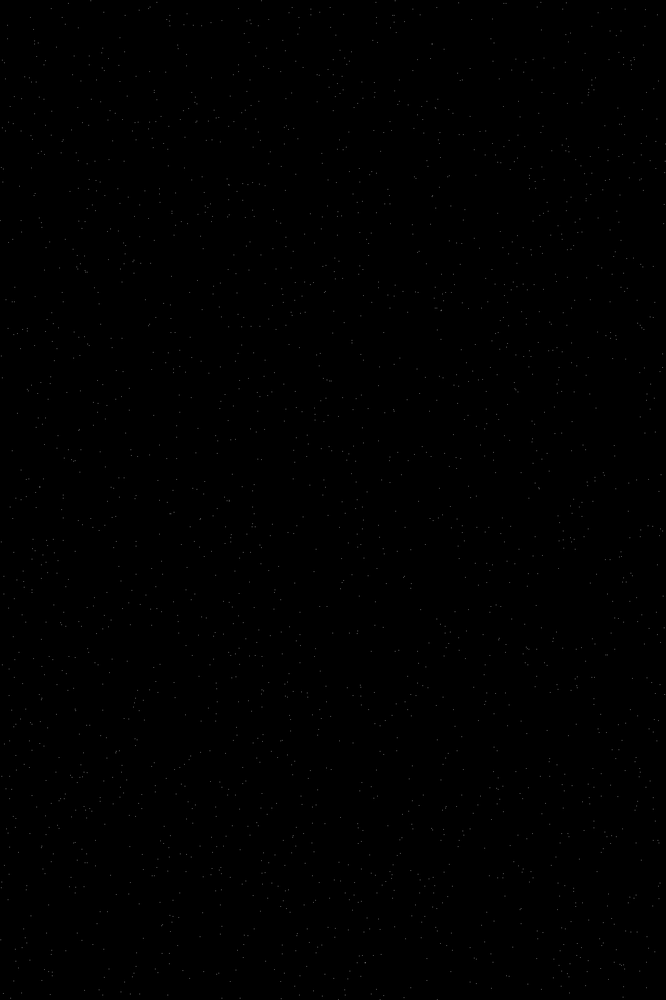

Ecology: gnuplot
Topography Levels: 15
Lighting Levels: 5
Relief Density: 1
Projection: natural earth
Highlight: False
Hillshade: True



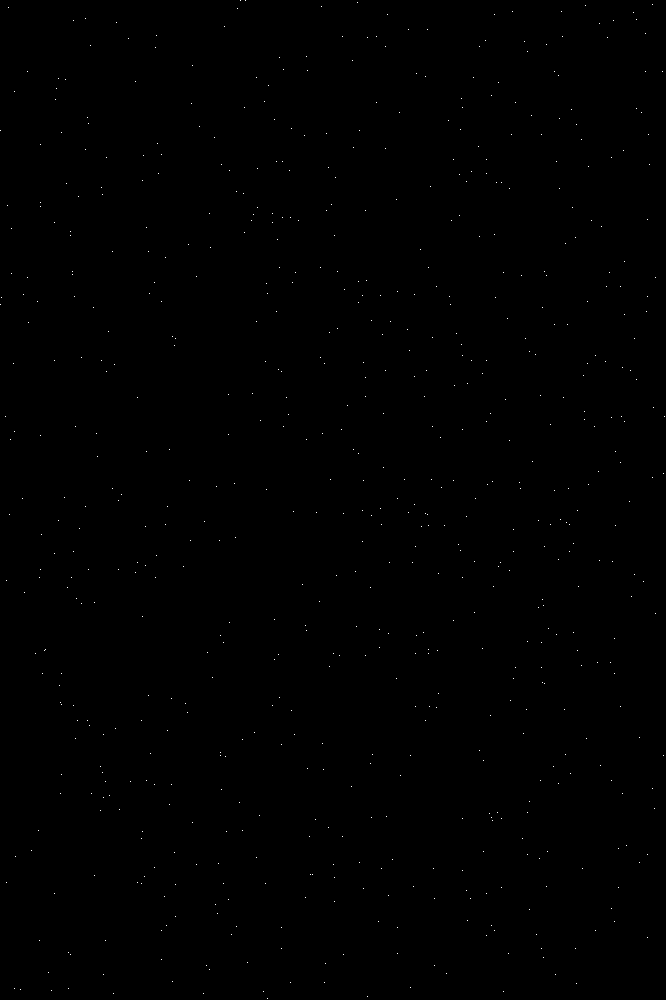

Ecology: rainbow_r
Topography Levels: 10
Lighting Levels: 10
Relief Density: 4
Projection: azimuthal equidistant
Highlight: True
Hillshade: False


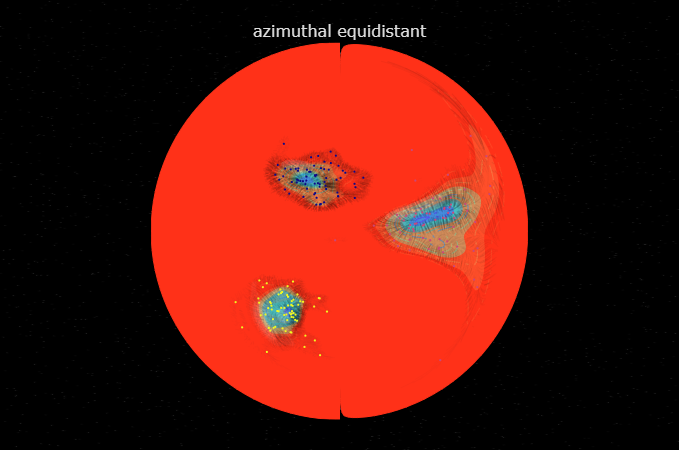

In [6]:
for ix, projection in enumerate(["orthographic", "natural earth", "azimuthal equidistant"]):
    ecology = ['gist_earth', 'gnuplot', 'rainbow_r']
    topography_levels = int(np.random.choice([x for x in range(5,25,5)],1)[0])
    lighting_levels = int(np.random.choice([x for x in range(5,25,5)],1)[0])
    relief_density = np.random.randint(1,5)
    plot_highlight = np.random.choice([True, False])
    plot_hillshade = np.random.choice([True, False])
    
    print("Ecology: {}".format(ecology[ix]))
    print("Topography Levels: {}".format(topography_levels))
    print("Lighting Levels: {}".format(lighting_levels))
    print("Relief Density: {}".format(relief_density))
    print("Projection: {}".format(projection))
    print("Highlight: {}".format(plot_highlight))
    print("Hillshade: {}".format(plot_hillshade))

    blob_planet.change_ecology(ecology[ix])
    blob_planet.fit_terraform(topography_levels=topography_levels,
                              lighting_levels=lighting_levels,
                              relief_density=relief_density,
                              plot_highlight=plot_highlight,
                              plot_hillshade=plot_hillshade,
                              projection=projection,
                              planet_name=projection)